<h1><center>Air Quality and 311 Requests 2021 - Getting More Samples</center></h1>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.image as mpimg
import requests
import os
import glob

import folium
from folium.features import DivIcon
from folium import FeatureGroup
import geopandas as gpd

import time
import datetime

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

After the previous analyses, we thought that we would like to get more samples so we could generalize our result. So we searched for all PurpleAir sensors with complete 2021 PM2.5 and PM10 concentration which located on the Los Angeles Neighborhood Councils area. Then we randomly select six samples of size 15. This time the radius of the circles is 1.5 mi instead of 2 mi. 

However, after much consideration, we decided to discontinued this project since it was highly unlikely we would find anything interesting if we continued with this project.

In [2]:
# Import function from pa_tools.py
from pa_tools import get_sensorslist, get_sensors_df, plot_sensors, create_s_list, find_sensor_w_complete_row, plot_sensors_with_circle, get_one_sample

In [3]:
# Information to get PurpleAir data through API
READ_KEY = "A6E4A431-2262-11ED-B5AA-42010A800006" 
headers = {'X-API-Key': READ_KEY,}
location = "outdoor"

<h2>Systematically Find Sensors which have Complete PMs Data</h2>

<h4>Get UNIX Timestamp of Start Date</h4>

In [4]:
# assigned regular string date (year, month, date, hour, minute)
start_date_time = datetime.datetime(2021, 1, 1, 16, 0) 

# print regular python date&time
print("start_date_time =>", start_date_time)
 
# displaying unix timestamp after conversion
unix_start_time = time.mktime(start_date_time.timetuple())
print("unix_start_time => ",
      (unix_start_time))

start_date_time => 2021-01-01 16:00:00
unix_start_time =>  1609545600.0


<h4>Get UNIX Timestamp of End Date</h4>

In [5]:
# assigned regular string date (year, month, date, hour, minute, second)
end_date_time = datetime.datetime(2022, 1, 1, 16, 59, 59) 

# print regular python date&time
print("end_date_time =>",end_date_time)
 
# displaying unix timestamp after conversion
unix_end_time = time.mktime(end_date_time.timetuple())
print("unix_end_time => ",
      (unix_end_time))

end_date_time => 2022-01-01 16:59:59
unix_end_time =>  1641085199.0


<h3>Get Sensors Within Each Bounding Box</h3> 

In [6]:
nc_geo = gpd.read_file('Neighborhood_Councils_(Certified).geojson') 
nc_geo = nc_geo[["NC_ID", "NAME", "SERVICE_RE","geometry"]]

In [7]:
# Create a base map
longitude = -118.2518
latitude = 34.0488
m4 = folium.Map(location=[latitude, longitude], tiles = 'CartoDB positron', zoom_start=11, min_zoom=8,max_zoom=15)

# Add several TileLayers
folium.TileLayer('openstreetmap').add_to(m4)
folium.TileLayer('stamenterrain').add_to(m4)

In [8]:
# Create choropleth map of NC
cpleth = folium.Choropleth(geo_data = nc_geo,
            name='Choropleth',
            key_on='features.properties.Name',
            #line_color='green', 
            #fill_color='YlGn',
            fill_opacity=0.1, line_opacity=0.3
            ).add_to(m4) 

In [9]:
# create a layer on the map object
shapesLayer = folium.FeatureGroup(name="Vector Shapes").add_to(m4)

# create a rectangle object and add to map

row_1 = [(34.34, -118.595), (34.295, -118.38)]
row_2 = [(34.295, -118.66), (34.21822825780853, -118.235)]
row_3 = [(34.21822825780853, -118.67), (34.165, -118.33)]
row_4 = [(34.165, -118.65), (34.126, -118.16645838142824)]
row_5 = [(34.126, -118.48408783344243), (34.062, -118.155)]
row_6 = [(34.062, -118.472), (34.01182143302939, -118.19108390252059)]
row_7 = [(34.01182143302939, -118.486), (33.91602139262306, -118.227)]
row_8 = [(33.91602139262306, -118.29208411524436), (33.872, -118.28)]
row_9 = [(33.872, -118.311), (33.84631525282126, -118.281)]
# Col_1 and col_1 are below row_9 and above row_10
col_1 = [(33.84631525282126, -118.31), (33.806, -118.2966)]
col_2 = [(33.83, -118.23), (33.806, -118.22)]
row_10 = [(33.806, -118.333), (33.70321097623646, -118.21762001616379)]

row_col_list = [row_1, row_2, row_3, row_4, row_5, row_6, row_7, row_8, row_9, col_1, col_2, row_10]

for row in row_col_list:
    folium.Rectangle(
        row,
        weight=2,
        fill_color="orange",
        fill_opacity=0.4).add_to(shapesLayer)

# display the layer switcher widget
folium.LayerControl().add_to(m4)

m4

In [10]:
# This part is commented so it won't call the API everytime we refresh the notebook.
#fnames = ['row_1', 'row_2', 'row_3', 'row_4', 'row_5', 'row_6', 'row_7', 'row_8', 'row_9', 'col_1', 'col_2', 'row_10']
#i = 0

#for bb_box in row_col_list:
#    sensors_list_all = get_sensors_df(bb_box[0][1],bb_box[0][0], bb_box[1][1], bb_box[1][0],location,READ_KEY)
#    temp_df = find_sensor_w_complete_row(sensors_list_all, unix_start_time, unix_end_time, headers)
    
    # Save dataframe to csv
#    folderpath = 'PurpleAir/All_NC_Sensors/'
#    suffix = '.csv'
#    filename = os.path.join(folderpath, f'{fnames[i]}' + suffix)
#    temp_df.to_csv(filename, index=False, header=True)
#    i +=1
#    print(filename)

In [11]:
#use glob to get all the csv files in the folder
path = 'PurpleAir/All_NC_Sensors/'
csv_files = glob.glob(os.path.join(path, "*.csv"))

# Create an empty list
temp_list = []

for f in csv_files:    
    path, filename = os.path.split(f)
    root, ext = os.path.splitext(filename)
    root = pd.read_csv(f)
    # Append each dataframe into temp_list
    temp_list.append(root)
          
all_nc_sensors_df = pd.concat(temp_list, axis = 0)

In [12]:
all_nc_sensors_df.isnull().sum()

sensor_index     0
name             0
location_type    0
latitude         0
longitude        0
dtype: int64

In [13]:
all_nc_sensors_df.head()

,sensor_index,name,location_type,latitude,longitude
0,87181,Granada Hills,0,34.304108,-118.514130
0,417,CCA Hamilton and Silvius,0,33.716675,-118.309906
1,489,CCA Lakme an Q,0,33.795550,-118.260940
2,1976,CCA 36th and Barbara,0,33.715576,-118.303795
3,4417,Point Fermin,0,33.707550,-118.291084


In [14]:
len(all_nc_sensors_df)

95

In [15]:
# Visualize all_nc_sensors_df
plot_sensors(all_nc_sensors_df)

We see that there are some sensors which are not located in the NC region. We will remove them.

In [16]:
# sensor_index to be removed. Start from upper left, then goes counter clockwise.
outer_idx = [29265, 83081, 34517, 75883, 36143, 83465, 57355, 36537, 32599, 14973, 87477, 
                  28503, 84319, 34421, 9076, 23429, 55351, 82569, 29295, 37611, 23181, 85471]
inner_idx = [72921, 70793, 34495, 34461, 37043, 22675]

In [17]:
temp = all_nc_sensors_df.set_index('sensor_index')
temp = temp.drop(outer_idx)
temp = temp.drop(inner_idx)

In [18]:
all_nc_sensors_df1 = temp.copy()
all_nc_sensors_df1 = all_nc_sensors_df1.sort_values(["name"], ascending=[True])
all_nc_sensors_df1 = all_nc_sensors_df1.reset_index()

In [19]:
all_nc_sensors_df1.head()

,sensor_index,name,location_type,latitude,longitude
0,21303,717 n citrus ave,0,34.084064,-118.33992
1,38649,875 Terrace 49,0,34.114075,-118.21108
2,75449,A4:CF:12:FE:4:42,0,34.001537,-118.45701
3,85645,AEnv,0,34.260450,-118.33701
4,27109,AQMD_NASA_248,0,34.164770,-118.59115


In [20]:
len(all_nc_sensors_df1)

67

In [21]:
# Visualize all_nc_sensors_df1
all_nc_sensors = plot_sensors(all_nc_sensors_df1)
all_nc_sensors.save('all_nc_sensors.html')
all_nc_sensors

In [22]:
#all_nc_sensors_df1

In [23]:
# Set the radius of the circles surrounding the monitoring stations in meter
miles = 1.5
meters = miles * 1609.34

In [24]:
# Visualize all sensors and the circles surrounding each sensor.
plot_sensors_with_circle(all_nc_sensors_df1, meters)

We see there are circles which only cover small part of NC region. We will also remove the sensors associate with this circle. Let's __remove the circles which less than 50% of its'area covers the NC region__. We did this since we assume that there is a high chance that the AQI from the sensors which circles only covers small region of NC were affected by region which is not part of the NC. 

In [25]:
# sensor_index to be removed. Start from upper left, then goes counter clockwise.
circle_50 = [2649, 51323, 22567, 87129, 4417, 417, 1976, 87129]

In [26]:
temp = all_nc_sensors_df1.set_index('sensor_index')
temp = temp.drop(circle_50)

In [27]:
all_nc_sensors_df2 = temp.copy()
all_nc_sensors_df2 = all_nc_sensors_df2.sort_values(["name"], ascending=[True])
all_nc_sensors_df2 = all_nc_sensors_df2.reset_index()

In [28]:
all_nc_sensors_df2.head()

,sensor_index,name,location_type,latitude,longitude
0,21303,717 n citrus ave,0,34.084064,-118.33992
1,38649,875 Terrace 49,0,34.114075,-118.21108
2,75449,A4:CF:12:FE:4:42,0,34.001537,-118.45701
3,85645,AEnv,0,34.260450,-118.33701
4,27109,AQMD_NASA_248,0,34.164770,-118.59115


In [29]:
len(all_nc_sensors_df2)

60

In [30]:
# Visualize all sensors and the circles surrounding each sensor.
plot_sensors_with_circle(all_nc_sensors_df2, meters)

<h2>Getting 6 Samples of Size n = 15</h2>

In [31]:
import random
from geopy.distance import geodesic as gd

In [32]:
# This part is commented so it rerun everytime we refresh the notebook.

# Get six samples of size n=15 and circle of radius 1.5
#for i in range(6):
#    temp_df = get_one_sample(all_nc_sensors_df2, 15, 1.5)
    
    # Save dataframe to csv
#    folderpath = 'PurpleAir/More_Samples/'
#    fname = f"sample_{i}"
#    suffix = '.csv'
#    filename = os.path.join(folderpath, fname + suffix)
#   temp_df.to_csv(filename, index=False)

In [33]:
#use glob to get all the csv files in the folder
path = 'PurpleAir/More_Samples/'
csv_files = glob.glob(os.path.join(path, "*.csv"))

# Create an empty list
samples_list = []

for f in csv_files:    
    path, filename = os.path.split(f)
    root, ext = os.path.splitext(filename)
    root = pd.read_csv(f)
    # Append each dataframe into temp_list
    samples_list.append(root)

# Display two rowns of each dataset
for dataset in samples_list:
    display(dataset.head(2))

,sensor_index,name,location_type,latitude,longitude
0,37217,"Forrester drive, Los Angeles, Ca 90064",0,34.040783,-118.402084
1,34481,Playa Vista,0,33.971844,-118.420940


,sensor_index,name,location_type,latitude,longitude
0,85359,Hollywoodland,0,34.121635,-118.322820
1,84069,Tarzana-Aleman,0,34.147762,-118.564156


,sensor_index,name,location_type,latitude,longitude
0,77657,Miracle Mile,0,34.058422,-118.357635
1,61565,Back garden,0,34.026264,-118.434750


,sensor_index,name,location_type,latitude,longitude
0,75449,A4:CF:12:FE:4:42,0,34.001537,-118.45701
1,85359,Hollywoodland,0,34.121635,-118.32282


,sensor_index,name,location_type,latitude,longitude
0,6450,AQMD_NASA_41,0,34.081703,-118.36750
1,78635,Baltimore St,0,34.118977,-118.21224


,sensor_index,name,location_type,latitude,longitude
0,37217,"Forrester drive, Los Angeles, Ca 90064",0,34.040783,-118.402084
1,15901,Colfax Meadows,0,34.149780,-118.383026


In [34]:
# Save the plot of each sample in html file
for i in range(6):
    temp = plot_sensors_with_circle(samples_list[i], meters)
    fname = f"sample_{i}.html"
    temp.save(fname)

Since it increase the size of the Jupyter Notebook a lot if we plot the six HTML files one by one. We decided to take a snapshot of each HTML plot and save each snapshoot in a png file. Afterwards, we read each snapshot and plotted them all together.

In [35]:
# Read the png files
img_0 = mpimg.imread('sample_0.png')
img_1 = mpimg.imread('sample_1.png')
img_2 = mpimg.imread('sample_2.png')
img_3 = mpimg.imread('sample_3.png')
img_4 = mpimg.imread('sample_4.png')
img_5 = mpimg.imread('sample_5.png')

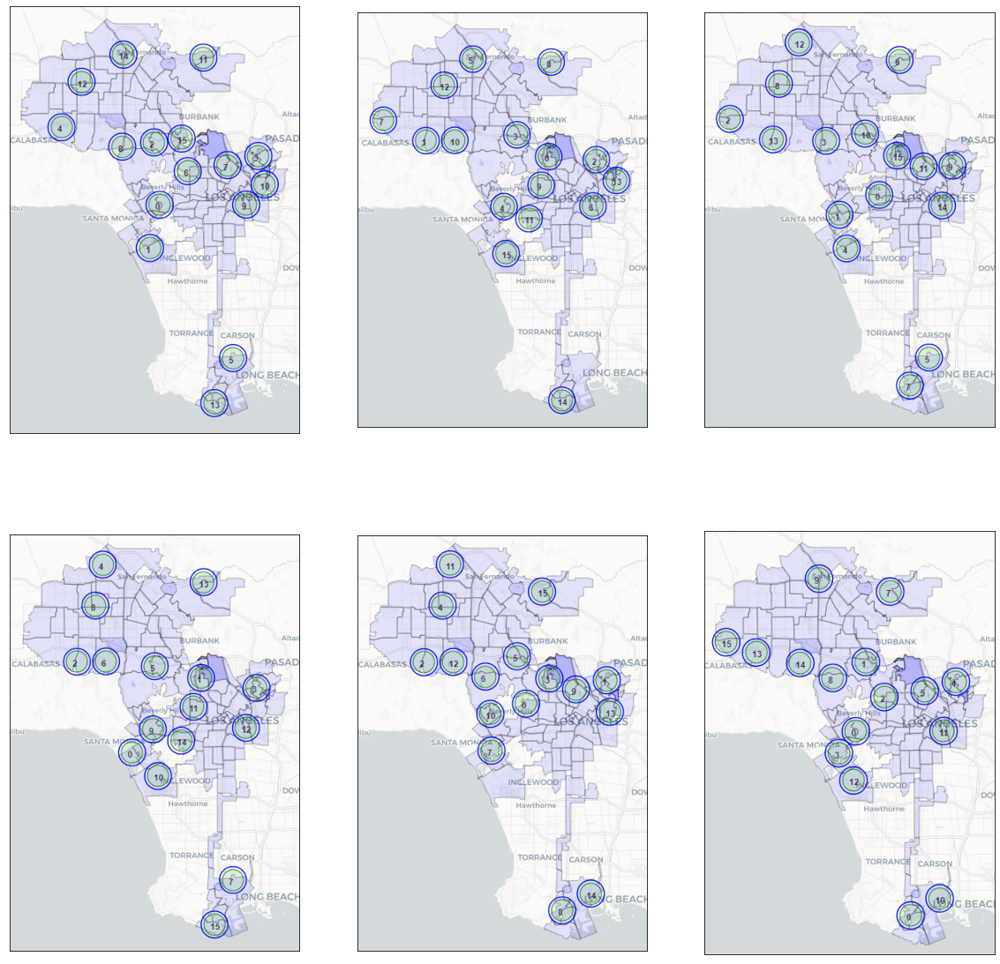

In [36]:
# Plot the png files
plt.figure(figsize=(20,20))
    
plt.subplot(2,3,1) 
plt.imshow(img_0)
plt.xticks([]) 
plt.yticks([]) 

plt.subplot(232)
plt.imshow(img_1)
plt.xticks([]) 
plt.yticks([]) 

plt.subplot(233)
plt.imshow(img_2)
plt.xticks([]) 
plt.yticks([]) 

plt.subplot(234)
plt.imshow(img_3)
plt.xticks([]) 
plt.yticks([]) 

plt.subplot(235)
plt.imshow(img_4)
plt.xticks([]) 
plt.yticks([]) 

plt.subplot(236)
plt.imshow(img_5)
plt.xticks([]) 
plt.yticks([]) 
    
plt.show()